In [2]:
%matplotlib inline
import pandas as pd
import numpy as np
import glob
import os
import matplotlib.pyplot as plt
import altair as alt
import plotnine as pn
from plotnine import ggplot, geom_point, aes, stat_smooth, facet_grid, theme, element_text, scale_x_discrete

pn.options.figure_size = (10, 15)
plt.style.use('ggplot')

# TOC Thematic Report - February 2019 
# Rough trends in water chemistry

A very rough/quick notebook to generate plots for Heleen's presentation at the WGE meeting in March 2019. The broad aim is to recreate Fig. 2 from Øyvind G's [2014 trends paper](https://link.springer.com/article/10.1007/s11270-014-1880-6).

## 1. Read stations

The 261 stations in the "core" ICPW programme are listed in `'core_sites_march_2019.xlsx'`. I have assigned each station to a region broadly compatibale to the geographic divisions in Øyvind's paper.

In [3]:
# Read station data
stn_xlsx = r'../../../Thematic_Trends_Report_2019/core_sites_march_2019.xlsx'
stn_df = pd.read_excel(stn_xlsx, sheet_name='Data')
print(len(stn_df))
stn_df.head()

261


,station_id,station_code,station_name,nfc_code,lat,lon,elev,continent,country,region
0,23461,CA10,"Nova Scotia, Mount Tom Lake",NaN,44.36800,-65.300,120.0,North America,Canada,Atl
1,23462,CA11,"Nova Scotia, Mountain Lake",NaN,44.32300,-65.258,120.0,North America,Canada,Atl
2,23463,CA12,"Nova Scotia, Little Red Lake",NaN,44.33700,-65.391,150.0,North America,Canada,Atl
3,23464,CA13,"Nova Scotia, Kejimkujik Lake",NaN,44.38333,-65.250,375.0,North America,Canada,Atl
4,23465,CA14,"Nova Scotia, Beaverskin Lake",NaN,44.30500,-65.326,120.0,North America,Canada,Atl


## 2. Read water chemsitry data

I have already calculated **annual medians** at each site for the main varaibles of interest, including applying unit conversions and sea-salt corrections where appropriate. The code below reads the annual series for each site and then divided the series by the first valid value for each parameter. This creates a series of relative values (essentially fractional change through time compared to about 1990).

In [4]:
# Params of interest
pars = ['ESO4X', 'ENO3', 'ECaX_EMgX', 'TOC', 'EH']

# Folder with annual median series
data_fold = r'../../../Thematic_Trends_Report_2019/results/annual_chemistry_series'
search_path = os.path.join(data_fold, '*.csv')
flist = glob.glob(search_path)

# Loop over sites
df_list = []
for fpath in flist:
    # Get station metadata
    stn_id = int(os.path.split(fpath)[1].split('_')[1][:-4])
    region = stn_df.query('station_id == @stn_id')['region'].values[0]

    # Read series
    df = pd.read_csv(fpath, encoding = 'utf-8')

    # Delete unwanted cols and tidy
    del df['Unnamed: 0'], df['STATION_ID']
    df.set_index('YEAR', inplace=True)
    df.sort_index(inplace=True)
    
    for col in df.columns:
        if col not in pars:
            del df[col]
    
    # Get first value in series
    for col in df.columns:
        # Values equal to exactly zero must be wrong
        # Convert to NaN
        df[col][df[col]==0] = np.nan
        vals = df[col].dropna().values
        
        # If at least one valid value in series, get the first
        if len(vals) > 0:
            first = vals[0]
        else:
            first = np.nan
            
        # Calc relative values
        df[col] = df[col] / first

    # Build results df
    df['region'] = region
    df['station_id'] = stn_id
    df.reset_index(inplace=True)
    df_list.append(df)
    
# Combine and tidy
df = pd.concat(df_list, axis=0)
df['YEAR'] = df['YEAR'].astype(int)
df.reset_index(inplace=True, drop=True)
df = df.melt(id_vars=['YEAR', 'region', 'station_id'])

# Ignore Baltic countries and Moldova (not in Øyvind's paper and 
# some strange data)
df = df.query('region not in ("Balt", "Moldova")')

df.head()

,YEAR,region,station_id,variable,value
0,1990,SoN,108,TOC,1.000000
1,1991,SoN,108,TOC,0.952159
2,1992,SoN,108,TOC,1.242707
3,1993,SoN,108,TOC,1.283547
4,1994,SoN,108,TOC,1.306884


## 3. Explore data
### 3.1. All data

The code below uses Altair to create an interactive plot. Hovering the mouse over any point will display information, including the station code. This makes it much easier to identify problem data series.

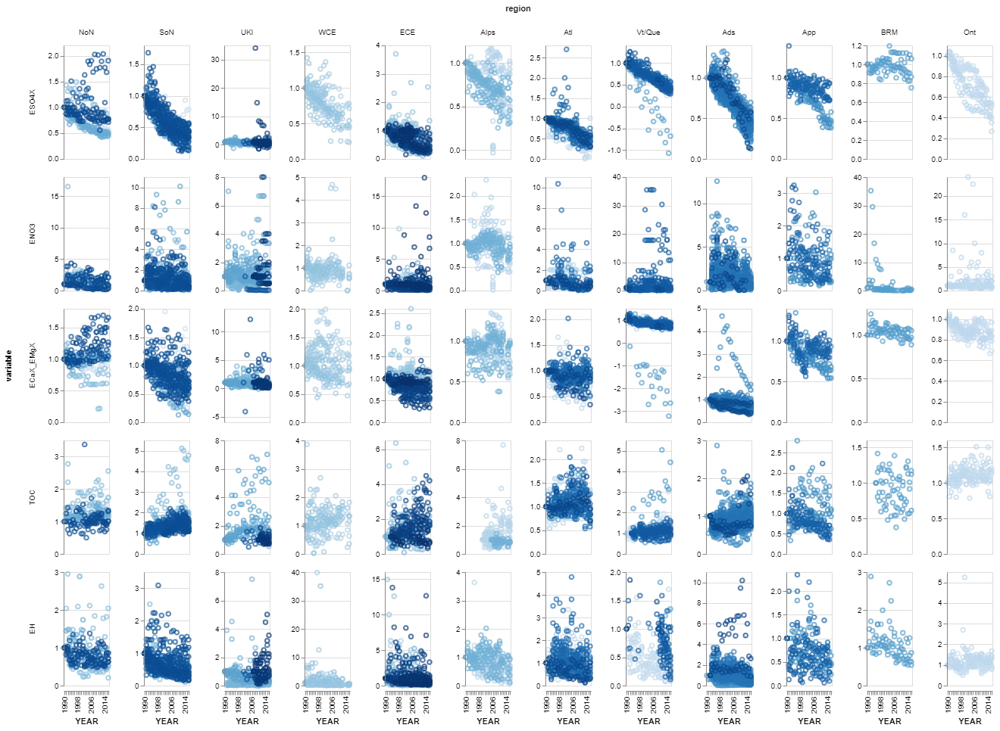

In [5]:
# Altair plot
alt.data_transformers.enable('default', max_rows=None)
c = alt.Chart(df).mark_point().encode(
      x='YEAR:O',
      y=alt.Y('value:Q', axis=alt.Axis(title='')),
      color=alt.Color('station_id:O', legend=None),
).properties(
      width=60,
      height=150,
).facet(
      column=alt.Column('region', sort=['NoN', 'SoN', 'UKI', 'WCE', 'ECE', 'Alps', 
                                        'Atl', 'Vt/Que', 'Ads', 'App', 'BRM', 'Ont']),
      row=alt.Column('variable', sort=['ESO4X', 'ENO3', 'ECaX_EMgX', 'TOC', 'EH'])
).resolve_scale(
      y='independent'
)
c

There are lots of strange-looking points on the above plots. This will be a useful starting point for data cleaning, but for now I don't have time to systematically investigate outliers. For future reference, the following stations seems to show atypical behaviour for at least some parameters

    [38561, 23621, 36165, 37765, 23622, 38568, 36458, 23467, 23725, 23726, 
     23644, 23536, 23731, 23604, 23669, 23545, 23610, 23548, 38557, 23518]

### 3.2. Clipped data

For now, I will simply **clip the data to the range between 0 and 2**. This is not at all rigorous and is likely include lots of dubious data points, but it's the best I can do in advance of Heleen's meeting. 

In [12]:
# Clip
df2 = df.query('0 < value < 2').copy()

# Convert 'region' and 'variable' to custom categorical data types
reg_type = pd.api.types.CategoricalDtype(categories=['NoN', 'SoN', 'UKI', 'WCE', 'ECE', 'Alps', 
                                                     'Atl', 'Vt/Que', 'Ads', 'App', 'BRM', 'Ont'],
                                         ordered=True)
df2['region'] = df2['region'].astype(reg_type)

var_type = pd.api.types.CategoricalDtype(categories=['ESO4X', 'ENO3', 'ECaX_EMgX', 'TOC', 'EH'],
                                         ordered=True)
df2['variable'] = df2['variable'].astype(var_type)

df2.head()

,YEAR,region,station_id,variable,value
0,1990,SoN,108,TOC,1.000000
1,1991,SoN,108,TOC,0.952159
2,1992,SoN,108,TOC,1.242707
3,1993,SoN,108,TOC,1.283547
4,1994,SoN,108,TOC,1.306884


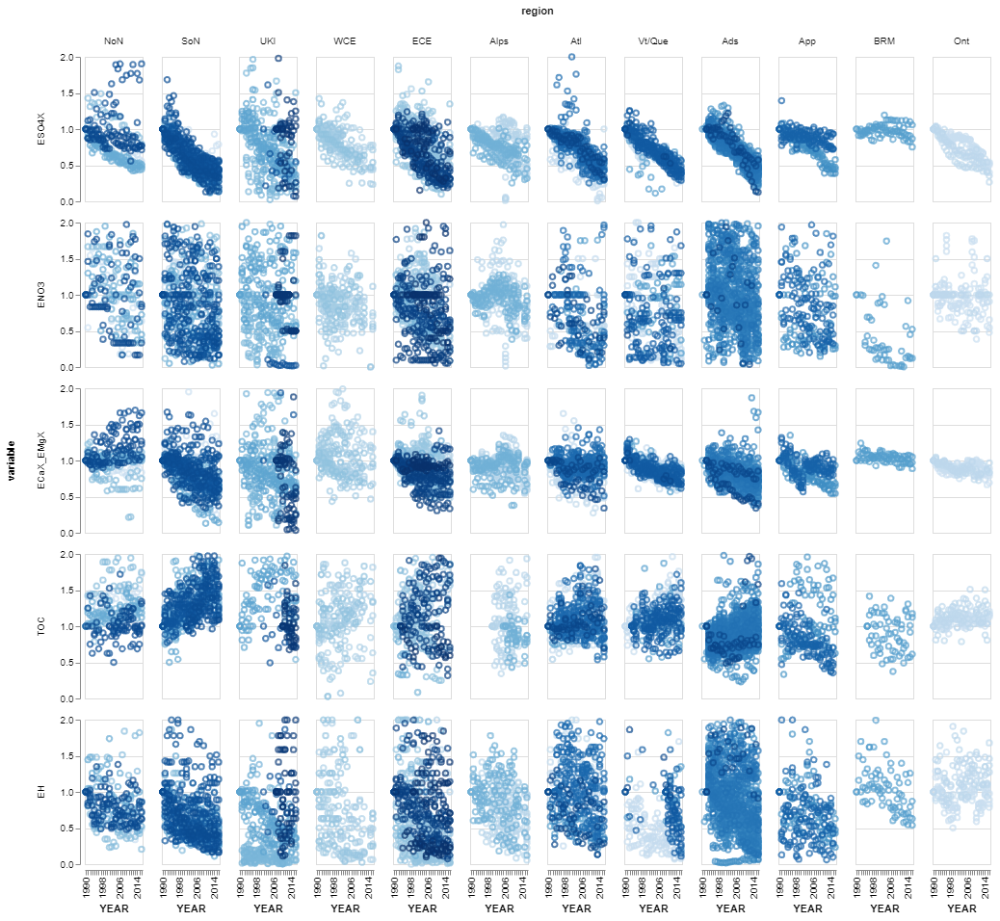

In [13]:
# Altair plot
alt.data_transformers.enable('default', max_rows=None)
c = alt.Chart(df2).mark_point().encode(
      x='YEAR:O',
      y=alt.Y('value:Q', axis=alt.Axis(title='')),
      color=alt.Color('station_id:O', legend=None),
).properties(
      width=60,
      height=150,
).facet(
      column=alt.Column('region', sort=['NoN', 'SoN', 'UKI', 'WCE', 'ECE', 'Alps', 
                                        'Atl', 'Vt/Que', 'Ads', 'App', 'BRM', 'Ont']),
      row=alt.Column('variable', sort=['ESO4X', 'ENO3', 'ECaX_EMgX', 'TOC', 'EH'])
)
c

The code below uses [plotnine](https://plotnine.readthedocs.io/en/latest/index.html) to generate a facet-grid of the clipped data with a similar layout to the version in Øyvind's paper. Note however that I'm using **lowess smoothing** here, rather than cubic splines.

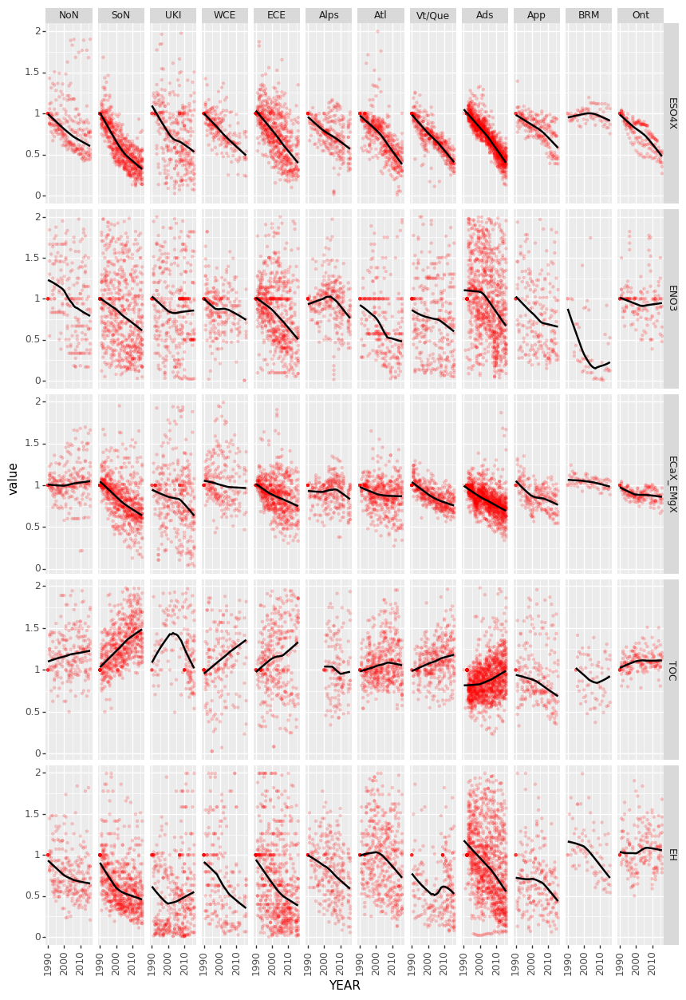

<ggplot: (8749809422102)>

In [16]:
# Static plot
p = (ggplot(df2, aes('YEAR', 'value'))
     + geom_point(alpha=0.2, stroke=0.1, color='red')
     + stat_smooth(method='lowess', se=False)
     + facet_grid('variable~region', scales='free_y', shrink=True)
     + theme(axis_text_x=element_text(rotation=90)))
p

In [20]:
out_png = r'../../../Thematic_Trends_Report_2019/raw_wq_trends.png'
p.save(out_png, width=8, height=12, units='in', dpi=300)

/opt/conda/lib/python3.6/site-packages/plotnine/ggplot.py:706: UserWarning: Saving 8 x 12 in image.
  from_inches(height, units), units))
/opt/conda/lib/python3.6/site-packages/plotnine/ggplot.py:707: UserWarning: Filename: ../../../Thematic_Trends_Report_2019/raw_wq_trends.png
  warn('Filename: {}'.format(filename))
